In [ ]:
import os
import random
import numpy as np
from io import BytesIO

# Plotting and dealing with images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import tensorflow as tf

# Interactive widgets
from ipywidgets import widgets
from IPython.display import display

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving fruit-ripeness-classifier.zip to fruit-ripeness-classifier.zip


In [ ]:
import zipfile

with zipfile.ZipFile('fruit-ripeness-classifier.zip', 'r') as zip_ref:
    zip_ref.extractall('fruit-ripeness-classifier')

In [ ]:
# List of labels to write to the file
labels = [
    # Ripe categories
    "RipeApple", "RipeBanana", "RipeDragonFruit",  "RipeGrape",
    "RipeGuava", "RipeOrange", "RipePapaya", "RipePineapple",
    "RipePomegranate", "RipeStrawberry",
    # Unripe categories
    "UnripeApple", "UnripeBanana", "UnripeDragonFruit", "UnripeGrape",
    "UnripeGuava", "UnripeOrange", "UnripePapaya", "UnripePineapple",
    "UnripePomegranate", "UnripeStrawberry",
    # Rotten Categories
    "RottenApple", "RottenBanana", "RottenDragonFruit", "RottenGrape",
    "RottenGuava", "RottenOrange", "RottenPapaya", "RottenPineapple",
    "RottenPomegranate", "RottenStrawberry"]

file_name = "fruit_labels.txt"

# Open the file to write and write the label into the file
with open("fruit_labels.txt", "w") as f:
    for label in train_dataset.class_names:
        f.write(label + "\n")


print(f"File '{file_name}' successfully created.")


File 'fruit_labels.txt' successfully created.


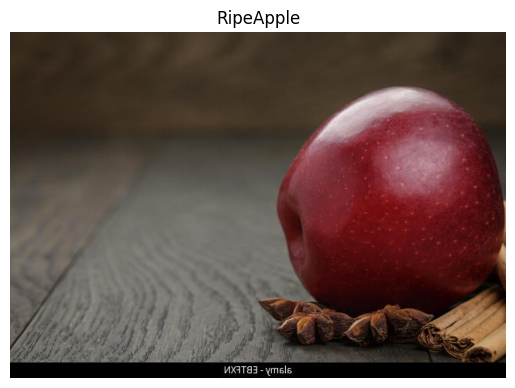

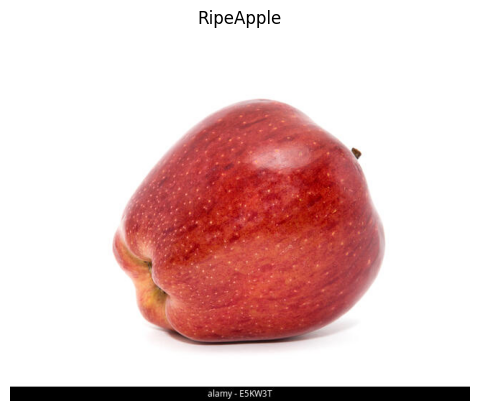

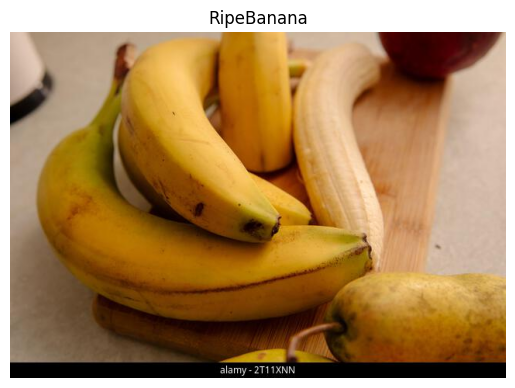

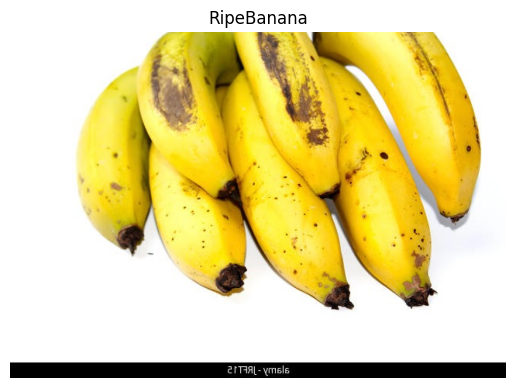

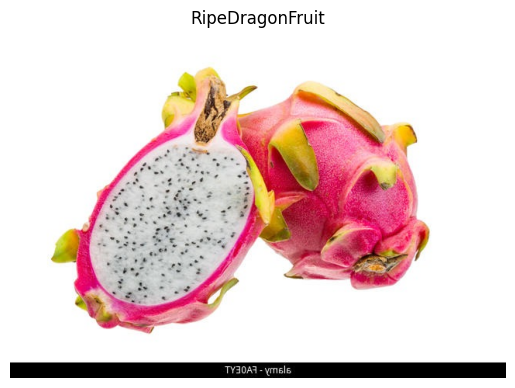

...

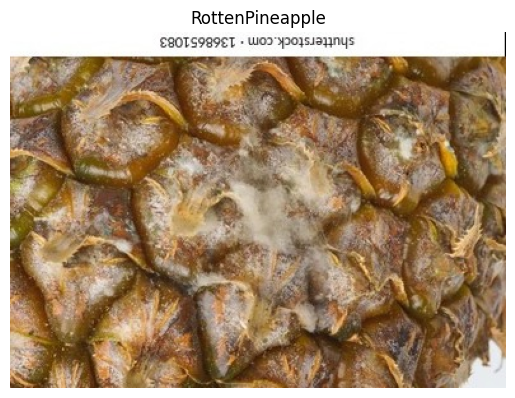

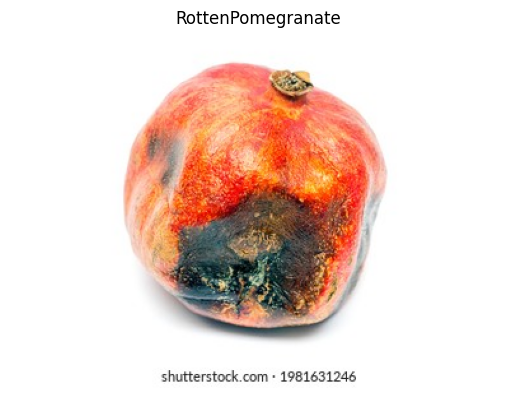

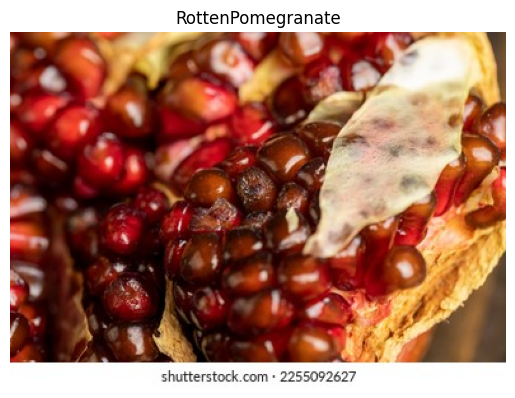

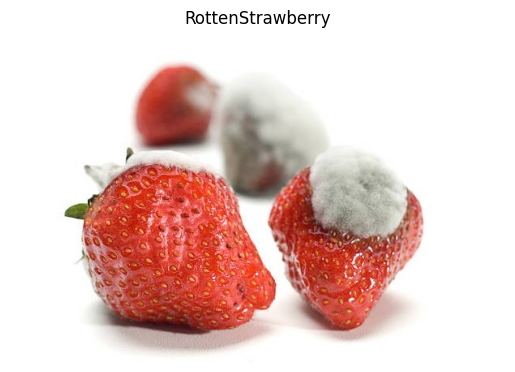

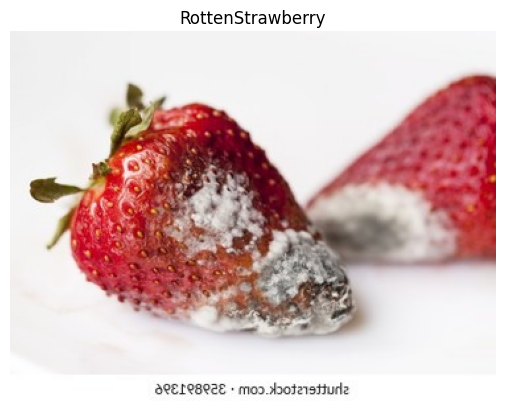

In [ ]:
BASE_DIR = r'/content/fruit-ripeness-classifier/DatasetV2'

# List of fruit names with categories
categories = [
    # Ripe categories
    "RipeApple", "RipeBanana", "RipeDragonFruit",  "RipeGrape",
    "RipeGuava", "RipeOrange", "RipePapaya", "RipePineapple",
    "RipePomegranate", "RipeStrawberry",
    # Unripe categories
    "UnripeApple", "UnripeBanana", "UnripeDragonFruit", "UnripeGrape",
    "UnripeGuava", "UnripeOrange", "UnripePapaya", "UnripePineapple",
    "UnripePomegranate", "UnripeStrawberry",
    # Rotten Categories
    "RottenApple", "RottenBanana", "RottenDragonFruit", "RottenGrape",
    "RottenGuava", "RottenOrange", "RottenPapaya", "RottenPineapple",
    "RottenPomegranate", "RottenStrawberry"
]

# Loop to randomly select and display images from each category
for category in categories:
    category_dir = os.path.join(BASE_DIR, category)
    if os.path.isdir(category_dir):
        file_names = os.listdir(category_dir)

        if len(file_names) >= 2:
            sample_files = random.sample(file_names, k=2)
        else:
            sample_files = file_names

        sample_paths = [os.path.join(category_dir, fname) for fname in sample_files]

        # Displaying images
        for img_path in sample_paths:
            try:
                img = mpimg.imread(img_path)
                plt.imshow(img)
                plt.axis('Off')
                plt.title(category)
                plt.show()
            except Exception as e:
                print(f"Failed to load image {img_path}: {e}")
    else:
        print(f"Directory {category_dir} does not exist.")


In [ ]:
# Dataset main directory
BASE_DIR = r'/content/fruit-ripeness-classifier/DatasetV2'

# Creating a training dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    BASE_DIR,
    validation_split=0.2,    # 20% for validation, 80% for training
    subset="training",
    seed=123,
    image_size=(224, 224),
    batch_size=32,
    label_mode='categorical'
)

# Creating a validation dataset
validation_dataset = tf.keras.utils.image_dataset_from_directory(
    BASE_DIR,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(224, 224),
    batch_size=32,
    label_mode='categorical'
)

# Optimizing datasets for training
SHUFFLE_BUFFER_SIZE = 1000
PREFETCH_BUFFER_SIZE = tf.data.AUTOTUNE

train_dataset_final = (train_dataset
                       .cache()
                       .shuffle(SHUFFLE_BUFFER_SIZE)
                       .prefetch(PREFETCH_BUFFER_SIZE)
                       )

validation_dataset_final = (validation_dataset
                            .cache()
                            .prefetch(PREFETCH_BUFFER_SIZE)
                            )

Found 23993 files belonging to 30 classes.
Using 19195 files for training.
Found 23993 files belonging to 30 classes.
Using 4798 files for validation.


In [ ]:
data_cat = train_dataset.class_names

In [ ]:
data_cat

['RipeApple',
 'RipeBanana',
 'RipeDragonFruit',
 'RipeGrape',
 'RipeGuava',
 'RipeOrange',
 'RipePapaya',
 'RipePineapple',
 'RipePomegranate',
 'RipeStrawberry',
 'RottenApple',
 'RottenBanana',
 'RottenDragonFruit',
 'RottenGrape',
 'RottenGuava',
 'RottenOrange',
 'RottenPapaya',
 'RottenPineapple',
 'RottenPomegranate',
 'RottenStrawberry',
 'UnripeApple',
 'UnripeBanana',
 'UnripeDragonFruit',
 'UnripeGrape',
 'UnripeGuava',
 'UnripeOrange',
 'UnripePapaya',
 'UnripePineapple',
 'UnripePomegranate',
 'UnripeStrawberry']

In [ ]:
# Create a model with data augmentation layers
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(224, 224, 3)),
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomTranslation(0.2,0.2),
    tf.keras.layers.RandomContrast(0.4),
    tf.keras.layers.RandomZoom(0.2)
    ])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [ ]:
from keras.applications import ResNet50
import tensorflow as tf
from tensorflow.keras import  optimizers

In [ ]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
fine_tune_at = 100
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

In [ ]:
model = tf.keras.models.Sequential([
    data_augmentation,
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(128,activation='relu'),
    tf.keras.layers.Dense(len(data_cat),activation='softmax'),
])

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 30)             │         3,870 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,853,854 (91.00 MB)

 Trainable params: 19,719,070 (75.22 MB)

 Non-trainable params: 4,134,784 (15.77 MB)

In [ ]:
optimizer = optimizers.Adam(learning_rate=0.001)

In [ ]:
model.compile(optimizer=optimizer,
             loss="categorical_crossentropy",
              metrics=['accuracy']
             )

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# Callback to save the best model
checkpoint_cb = ModelCheckpoint("best_model.keras", save_best_only=True)

# Callback to stop training if val_accuracy > 91%
early_stopping_cb = EarlyStopping(monitor='val_accuracy',
                                  min_delta=0.005,
                                  patience=7,
                                  mode='max',
                                  restore_best_weights=True,
                                  verbose=1)

# Callback to reduce learning rate when val_loss does not improve
reduce_lr_cb = ReduceLROnPlateau(monitor='val_loss',
                                 factor=0.2,
                                 patience=3,
                                 verbose=1,
                                 min_delta=0.005,
                                 mode='min')
history = model.fit(
    train_dataset_final,
    epochs=25,
    validation_data=validation_dataset_final,
    callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr_cb]
)

Epoch 1/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 78s 68ms/step - accuracy: 0.6008 - loss: 1.3861 - val_accuracy: 0.7922 - val_loss: 0.7396 - learning_rate: 0.0010
Epoch 2/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step - accuracy: 0.8577 - loss: 0.4391 - val_accuracy: 0.8910 - val_loss: 0.3762 - learning_rate: 0.0010
Epoch 3/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step - accuracy: 0.9126 - loss: 0.2612 - val_accuracy: 0.8875 - val_loss: 0.3685 - learning_rate: 0.0010
Epoch 4/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step - accuracy: 0.9318 - loss: 0.2062 - val_accuracy: 0.9108 - val_loss: 0.3256 - learning_rate: 0.0010
Epoch 5/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step - accuracy: 0.9408 - loss: 0.1799 - val_accuracy: 0.9181 - val_loss: 0.2793 - learning_rate: 0.0010
Epoch 6/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - accuracy: 0.9516 - loss: 0.1482 - val_accuracy: 0.9135 - val_loss: 0.3625 - learning_rate: 0.0010
Epoch 7/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step - accuracy: 0.9571 - l

150/150 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.9824 - loss: 0.0886
Test accuracy: 0.9802001118659973


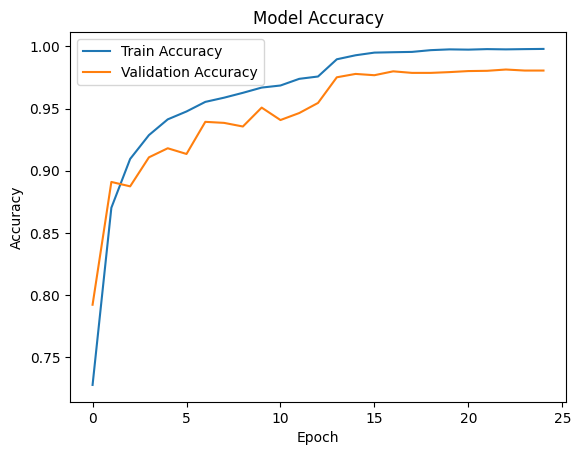

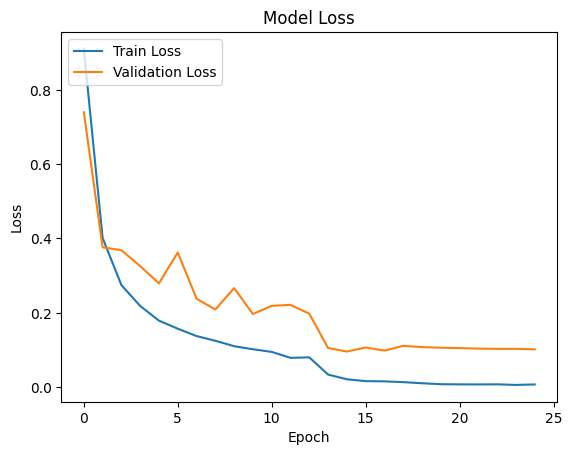

In [ ]:
# Evaluate the model's performance on the validation dataset
test_loss, test_acc = model.evaluate(validation_dataset_final)
print('Test accuracy:', test_acc)

# Plot the training and validation accuracy over epochs
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.show()

# Plot the training and validation loss over epochs
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.show()

<Figure size 1600x1600 with 0 Axes>

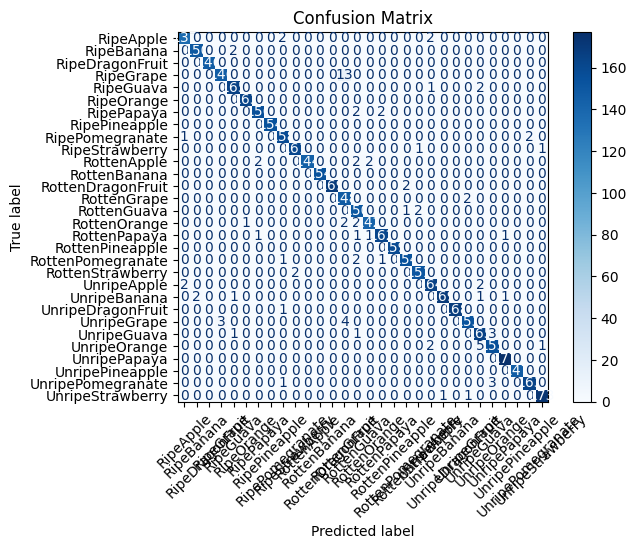

                   precision    recall  f1-score   support

        RipeApple       0.98      0.97      0.98       141
       RipeBanana       0.99      0.99      0.99       152
  RipeDragonFruit       1.00      1.00      1.00       146
        RipeGrape       0.98      0.92      0.95       159
        RipeGuava       0.98      0.98      0.98       168
       RipeOrange       0.99      1.00      1.00       163
       RipePapaya       0.98      0.97      0.98       160
    RipePineapple       1.00      1.00      1.00       154
  RipePomegranate       0.97      0.98      0.98       161
   RipeStrawberry       0.99      0.99      0.99       163
      RottenApple       1.00      0.96      0.98       150
     RottenBanana       1.00      1.00      1.00       154
RottenDragonFruit       1.00      0.99      0.99       171
      RottenGrape       0.89      0.99      0.93       150
      RottenGuava       0.94      0.98      0.96       153
     RottenOrange       0.98      0.97      0.97       

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import numpy as np
import matplotlib.pyplot as plt

# Get the predicted classes from the model on the validation dataset
y_true = []
y_pred = []

for images, labels in validation_dataset_final:
    predictions = model.predict(images, verbose=0)
    y_pred.extend(np.argmax(predictions, axis=1))
    y_true.extend(np.argmax(labels.numpy(), axis=1))

# Convert to numpy arrays for metric calculations
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculate the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Define the list of class names for better interpretation of the confusion matrix
classes = data_cat

# Display the confusion matrix as a heatmap
plt.figure(figsize=(16, 16))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title('Confusion Matrix')
plt.show()

# Calculate and print the classification report
report = classification_report(y_true, y_pred, target_names=classes)
print(report)


In [ ]:
import ipywidgets as widgets
from io import BytesIO
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Widget uploader
uploader = widgets.FileUpload(accept="image/*", multiple=True)
display(uploader)
out = widgets.Output()
display(out)

# Class list for prediction
classes = data_cat

def file_predict(filename, file_content, out, threshold=0.7):
    """Functions to make predictions and display results with notifications if the image is not recognized."""
    # Load and preprocess the image
    image = tf.keras.utils.load_img(BytesIO(file_content), target_size=(224, 224))
    image_array = tf.keras.utils.img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)

    # Make predictions with the model
    prediction = model.predict(image_array, verbose=0)[0]
    confidence_score = np.max(prediction)  # Highest probability
    predicted_index = np.argmax(prediction)

    with out:
        # Display the imaage
        plt.figure(figsize=(6, 6))
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Predicted: {classes[predicted_index]} ({confidence_score:.2f})")
        plt.show()

        if confidence_score < threshold:
            print(f"Warning: '{filename}' does not appear to be a recognized fruit. Please upload a valid fruit image.")
        else:
            print(f"The predicted class for '{filename}' is {classes[predicted_index]} with a confidence of {confidence_score:.2f}.")

def on_upload_change(change):
    """ Function to retrieve files from the widget and run predictions. """
    with out:
        out.clear_output()
        for filename, file_info in change['new'].items():
            file_content = file_info['content']  # Retrieve byte string from file
            file_predict(filename, file_content, out)

# Observation of changes to uploader
uploader.observe(on_upload_change, names='value')

FileUpload(value={}, accept='image/*', description='Upload', multiple=True)

Output()

In [ ]:
from google.colab import files
files.download("fruit_labels.txt")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
  from google.colab import files
  files.download("best_model.keras")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from keras.applications import DenseNet121, MobileNetV2, InceptionV3


In [ ]:
base_model_densenet = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model_densenet.layers[:100]:
    layer.trainable = False

model_densenet = tf.keras.models.Sequential([
    data_augmentation,
    base_model_densenet,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(len(data_cat), activation='softmax')
])

model_densenet.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=['accuracy']
)


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
history_densenet = model_densenet.fit(
    train_dataset_final,
    epochs=25,
    validation_data=validation_dataset_final,
    callbacks=[
        ModelCheckpoint("best_model_densenet.keras", save_best_only=True),
        early_stopping_cb,
        reduce_lr_cb
    ]
)


Epoch 1/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 150s 145ms/step - accuracy: 0.5344 - loss: 1.5661 - val_accuracy: 0.7514 - val_loss: 0.9206 - learning_rate: 0.0010
Epoch 2/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 78s 131ms/step - accuracy: 0.7969 - loss: 0.6447 - val_accuracy: 0.7297 - val_loss: 0.9001 - learning_rate: 0.0010
Epoch 3/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 78s 131ms/step - accuracy: 0.8419 - loss: 0.4862 - val_accuracy: 0.8737 - val_loss: 0.4052 - learning_rate: 0.0010
Epoch 4/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 77s 129ms/step - accuracy: 0.8720 - loss: 0.3896 - val_accuracy: 0.8641 - val_loss: 0.4489 - learning_rate: 0.0010
Epoch 5/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 77s 129ms/step - accuracy: 0.8883 - loss: 0.3319 - val_accuracy: 0.8635 - val_loss: 0.4508 - learning_rate: 0.0010
Epoch 6/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - accuracy: 0.9048 - loss: 0.2875
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
600/600 ━━━━━━━━━━━━━━━━━━━━ 77s 129ms/step - accuracy: 0.9

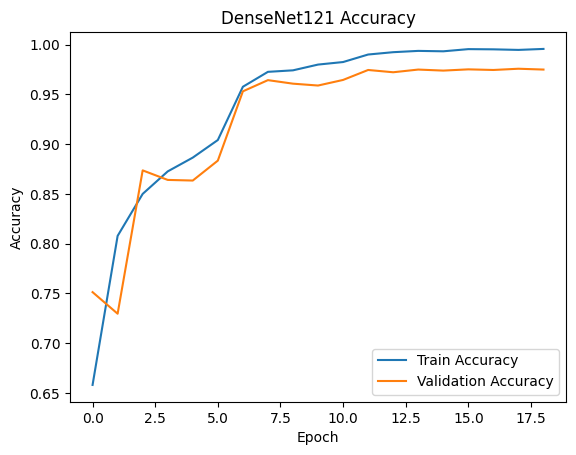

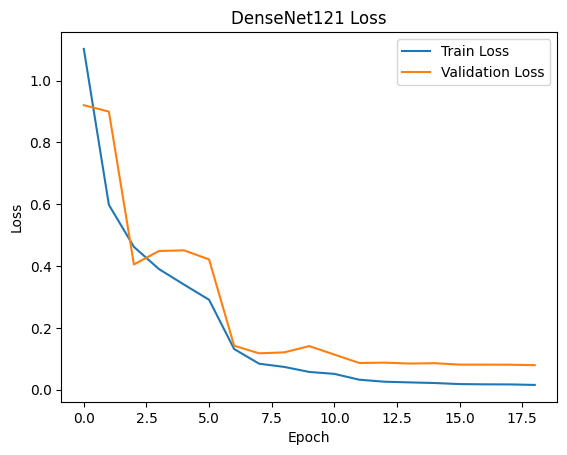

In [ ]:
plt.plot(history_densenet.history['accuracy'], label='Train Accuracy')
plt.plot(history_densenet.history['val_accuracy'], label='Validation Accuracy')
plt.title('DenseNet121 Accuracy')
plt.xlabel('Epoch'); plt.ylabel('Accuracy'); plt.legend(); plt.show()

plt.plot(history_densenet.history['loss'], label='Train Loss')
plt.plot(history_densenet.history['val_loss'], label='Validation Loss')
plt.title('DenseNet121 Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.legend(); plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━

<Figure size 1600x1600 with 0 Axes>

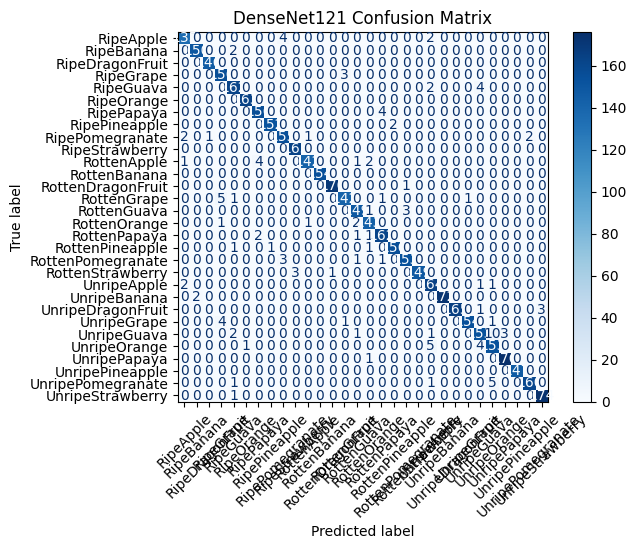

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

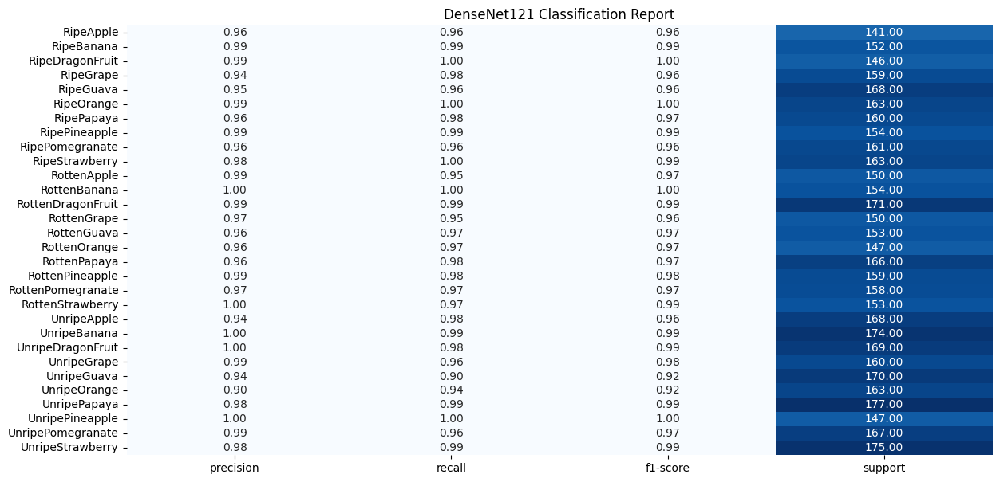

✅ Accuracy: 0.9745727386411005
✅ Weighted F1-score: 0.9745959660987217


,precision,recall,f1-score,support
weighted avg,0.97,0.97,0.97,4798.0


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Generate predictions
y_true = []
y_pred = []

for images, labels in validation_dataset_final:
    preds = model_densenet.predict(images)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(16, 16))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=data_cat)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title("DenseNet121 Confusion Matrix")
plt.show()

# Classification report as text and table
report_densenet = classification_report(y_true, y_pred, target_names=data_cat, output_dict=True)
df_densenet = pd.DataFrame(report_densenet).transpose()

# Save and download CSV
df_densenet.to_csv("metrics_densenet.csv")
files.download("metrics_densenet.csv")

# Show summary table as heatmap
display_cols = ["precision", "recall", "f1-score", "support"]
df_display = df_densenet[display_cols].round(2)

plt.figure(figsize=(14, 7))
sns.heatmap(df_display.iloc[:-3], annot=True, cmap="Blues", fmt=".2f", cbar=False)
plt.title("DenseNet121 Classification Report")
plt.yticks(rotation=0)
plt.xticks(rotation=0)
plt.show()

# Display weighted avg
print("✅ Accuracy:", report_densenet['accuracy'])
print("✅ Weighted F1-score:", df_densenet.loc['weighted avg', 'f1-score'])
display(df_densenet.loc[['weighted avg']][display_cols].round(2))


In [ ]:
base_model_mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model_mobilenet.layers[:100]:
    layer.trainable = False

model_mobilenet = tf.keras.models.Sequential([
    data_augmentation,
    base_model_mobilenet,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(len(data_cat), activation='softmax')
])

model_mobilenet.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=['accuracy']
)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
history_mobilenet = model_mobilenet.fit(
    train_dataset_final,
    epochs=25,
    validation_data=validation_dataset_final,
    callbacks=[
        ModelCheckpoint("best_model_mobilenet.keras", save_best_only=True),
        early_stopping_cb,
        reduce_lr_cb
    ]
)


Epoch 1/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 37s 37ms/step - accuracy: 0.3520 - loss: 2.2246 - val_accuracy: 0.0352 - val_loss: 17.0413 - learning_rate: 0.0010
Epoch 2/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - accuracy: 0.6136 - loss: 1.2441 - val_accuracy: 0.1480 - val_loss: 6.3698 - learning_rate: 0.0010
Epoch 3/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - accuracy: 0.6710 - loss: 1.0606 - val_accuracy: 0.1965 - val_loss: 9.9160 - learning_rate: 0.0010
Epoch 4/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - accuracy: 0.7054 - loss: 0.9254 - val_accuracy: 0.2043 - val_loss: 8.5360 - learning_rate: 0.0010
Epoch 5/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - accuracy: 0.7381 - loss: 0.8328 - val_accuracy: 0.2728 - val_loss: 5.6043 - learning_rate: 0.0010
Epoch 6/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - accuracy: 0.7563 - loss: 0.7607 - val_accuracy: 0.3308 - val_loss: 3.8875 - learning_rate: 0.0010
Epoch 7/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - accuracy: 0.7554 - 

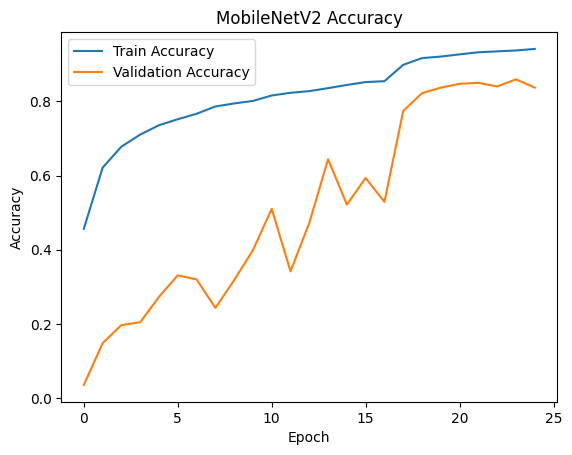

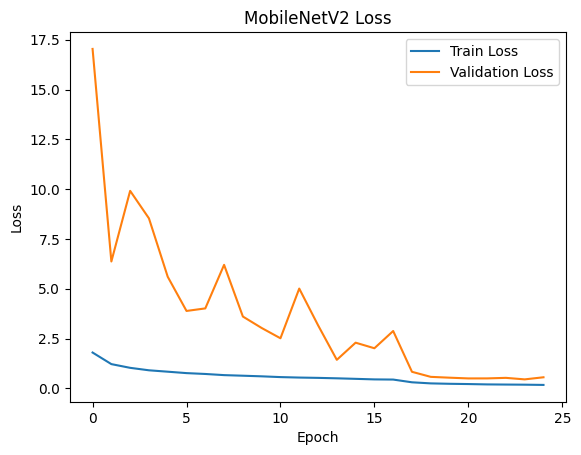

In [ ]:
plt.plot(history_mobilenet.history['accuracy'], label='Train Accuracy')
plt.plot(history_mobilenet.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2 Accuracy')
plt.xlabel('Epoch'); plt.ylabel('Accuracy'); plt.legend(); plt.show()

plt.plot(history_mobilenet.history['loss'], label='Train Loss')
plt.plot(history_mobilenet.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2 Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.legend(); plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━

<Figure size 1600x1600 with 0 Axes>

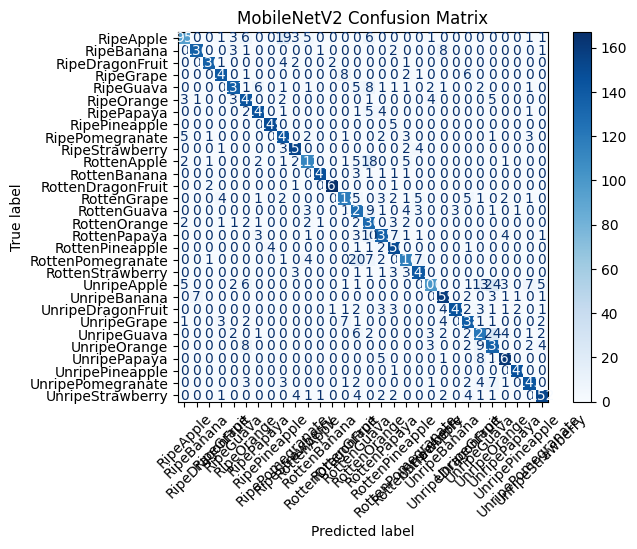

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

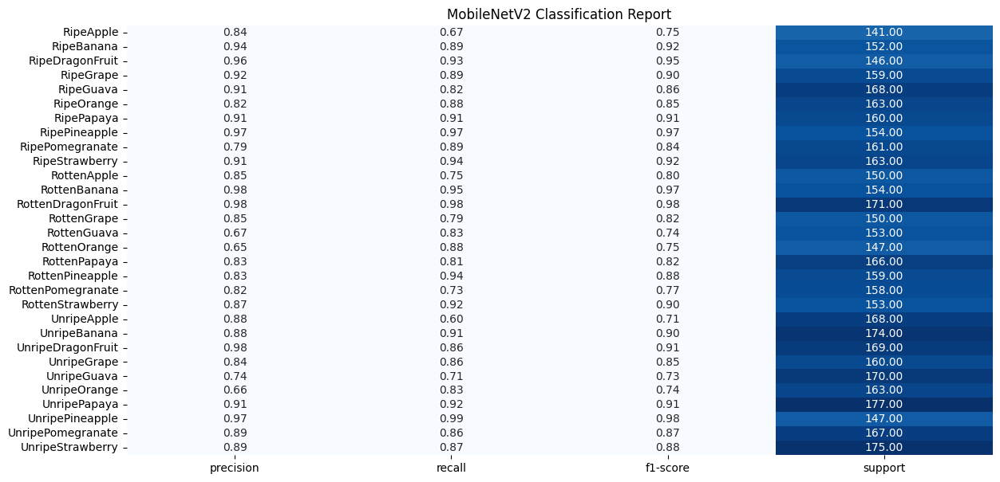

✅ Accuracy: 0.8595248020008337
✅ Weighted F1-score: 0.8596774424722268


,precision,recall,f1-score,support
weighted avg,0.87,0.86,0.86,4798.0


In [ ]:
y_true = []
y_pred = []

for images, labels in validation_dataset_final:
    preds = model_mobilenet.predict(images)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(16, 16))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=data_cat)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title("MobileNetV2 Confusion Matrix")
plt.show()

report_mobilenet = classification_report(y_true, y_pred, target_names=data_cat, output_dict=True)
df_mobilenet = pd.DataFrame(report_mobilenet).transpose()
df_mobilenet.to_csv("metrics_mobilenet.csv")
files.download("metrics_mobilenet.csv")

df_display = df_mobilenet[display_cols].round(2)
plt.figure(figsize=(14, 7))
sns.heatmap(df_display.iloc[:-3], annot=True, cmap="Blues", fmt=".2f", cbar=False)
plt.title("MobileNetV2 Classification Report")
plt.yticks(rotation=0)
plt.xticks(rotation=0)
plt.show()

print("✅ Accuracy:", report_mobilenet['accuracy'])
print("✅ Weighted F1-score:", df_mobilenet.loc['weighted avg', 'f1-score'])
display(df_mobilenet.loc[['weighted avg']][display_cols].round(2))


In [ ]:
base_model_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model_inception.layers[:100]:
    layer.trainable = False

model_inception = tf.keras.models.Sequential([
    data_augmentation,
    base_model_inception,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(len(data_cat), activation='softmax')
])

model_inception.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=['accuracy']
)


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
history_inception = model_inception.fit(
    train_dataset_final,
    epochs=25,
    validation_data=validation_dataset_final,
    callbacks=[
        ModelCheckpoint("best_model_inception.keras", save_best_only=True),
        early_stopping_cb,
        reduce_lr_cb
    ]
)


Epoch 1/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 85s 85ms/step - accuracy: 0.1251 - loss: 3.0694 - val_accuracy: 0.1542 - val_loss: 4.0816 - learning_rate: 0.0010
Epoch 2/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.3361 - loss: 2.1851 - val_accuracy: 0.3097 - val_loss: 2.5015 - learning_rate: 0.0010
Epoch 3/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4478 - loss: 1.8042 - val_accuracy: 0.4865 - val_loss: 1.6984 - learning_rate: 0.0010
Epoch 4/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.5041 - loss: 1.5779 - val_accuracy: 0.4210 - val_loss: 2.0192 - learning_rate: 0.0010
Epoch 5/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.5571 - loss: 1.4049 - val_accuracy: 0.4289 - val_loss: 2.1190 - learning_rate: 0.0010
Epoch 6/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5951 - loss: 1.2966 - val_accuracy: 0.5096 - val_loss: 1.5606 - learning_rate: 0.0010
Epoch 7/25
600/600 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.6211 - l

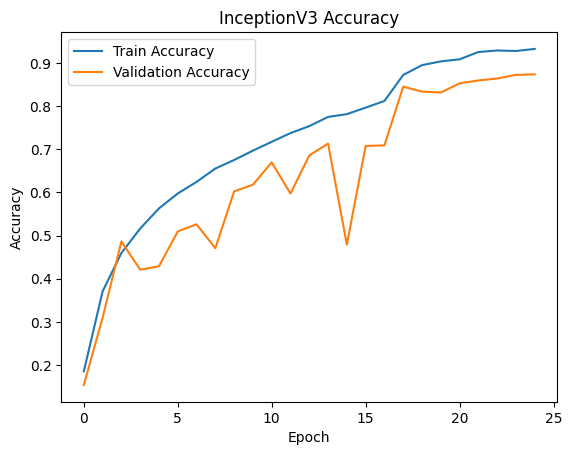

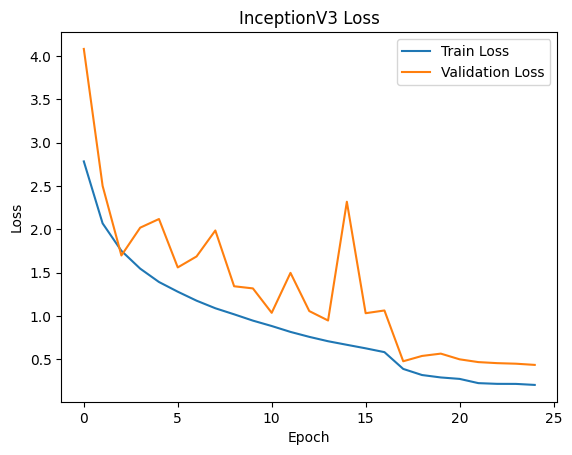

In [ ]:
plt.plot(history_inception.history['accuracy'], label='Train Accuracy')
plt.plot(history_inception.history['val_accuracy'], label='Validation Accuracy')
plt.title('InceptionV3 Accuracy')
plt.xlabel('Epoch'); plt.ylabel('Accuracy'); plt.legend(); plt.show()

plt.plot(history_inception.history['loss'], label='Train Loss')
plt.plot(history_inception.history['val_loss'], label='Validation Loss')
plt.title('InceptionV3 Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.legend(); plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━

<Figure size 1600x1600 with 0 Axes>

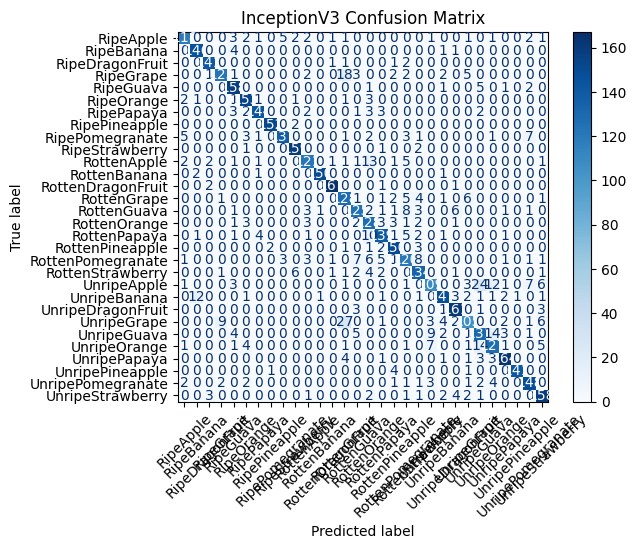

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

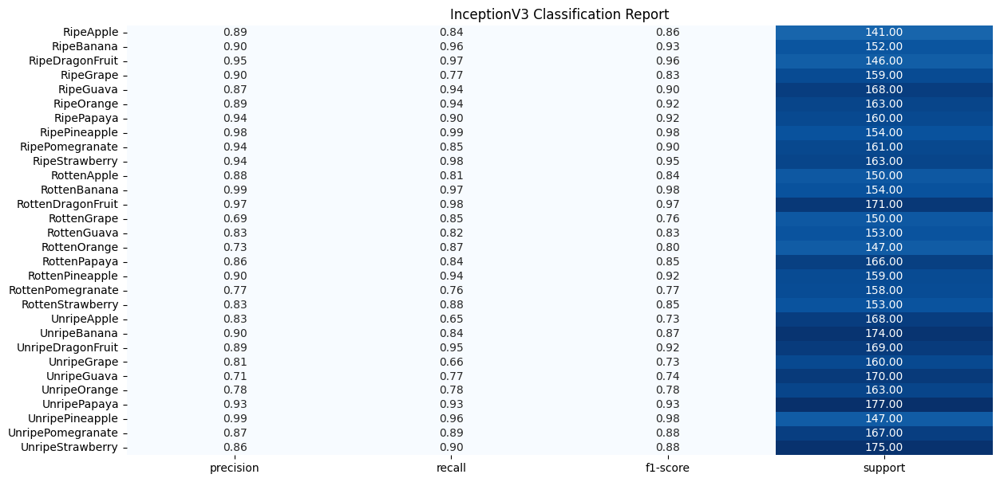

✅ Accuracy: 0.8720300125052105
✅ Weighted F1-score: 0.8714575009591079


,precision,recall,f1-score,support
weighted avg,0.87,0.87,0.87,4798.0


In [ ]:
y_true = []
y_pred = []

for images, labels in validation_dataset_final:
    preds = model_inception.predict(images)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(16, 16))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=data_cat)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title("InceptionV3 Confusion Matrix")
plt.show()

report_inception = classification_report(y_true, y_pred, target_names=data_cat, output_dict=True)
df_inception = pd.DataFrame(report_inception).transpose()
df_inception.to_csv("metrics_inception.csv")
files.download("metrics_inception.csv")

df_display = df_inception[display_cols].round(2)
plt.figure(figsize=(14, 7))
sns.heatmap(df_display.iloc[:-3], annot=True, cmap="Blues", fmt=".2f", cbar=False)
plt.title("InceptionV3 Classification Report")
plt.yticks(rotation=0)
plt.xticks(rotation=0)
plt.show()

print("✅ Accuracy:", report_inception['accuracy'])
print("✅ Weighted F1-score:", df_inception.loc['weighted avg', 'f1-score'])
display(df_inception.loc[['weighted avg']][display_cols].round(2))
